# Google Landmark Recognition Challenge 2020
Simplified image similarity ranking and re-ranking implementation with:
* EfficientNetB0 backbone for global feature similarity search
* DELF module for local feature reranking

Reference papers:
* 2020 Recognition challenge winner: https://arxiv.org/abs/2010.01650
* 2019 Recognition challend 2nd place: https://arxiv.org/abs/1906.03990

In [2]:
!nvidia-smi

Sun Apr 10 05:50:50 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.119.04   Driver Version: 450.119.04   CUDA Version: 11.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P0    27W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [3]:
# Importing libraries
import os
import cv2
import shutil
import numpy as np
import pandas as pd
from scipy import spatial
from tqdm import tqdm
import tensorflow as tf
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split

In [4]:
# Directories and file paths
TRAIN_DIR = '../input/landmark-recognition-2020/train'
TRAIN_CSV = '../input/landmark-recognition-2020/train.csv'
train_df = pd.read_csv(TRAIN_CSV)

TRAIN_PATHS = [os.path.join(TRAIN_DIR, f'{img[0]}/{img[1]}/{img[2]}/{img}.jpg') for img in train_df['id']]
train_df['path'] = TRAIN_PATHS

train_df

,id,landmark_id,path
0,17660ef415d37059,1,../input/landmark-recognition-2020/train/1/7/6...
1,92b6290d571448f6,1,../input/landmark-recognition-2020/train/9/2/b...
2,cd41bf948edc0340,1,../input/landmark-recognition-2020/train/c/d/4...
3,fb09f1e98c6d2f70,1,../input/landmark-recognition-2020/train/f/b/0...
4,25c9dfc7ea69838d,7,../input/landmark-recognition-2020/train/2/5/c...
...,...,...,...
1580465,72c3b1c367e3d559,203092,../input/landmark-recognition-2020/train/7/2/c...
1580466,7a6a2d9ea92684a6,203092,../input/landmark-recognition-2020/train/7/a/6...
1580467,9401fad4c497e1f9,203092,../input/landmark-recognition-2020/train/9/4/0...
1580468,aacc960c9a228b5f,203092,../input/landmark-recognition-2020/train/a/a/c...


In [6]:
# Subsetting
train_df_grouped = pd.DataFrame(train_df.landmark_id.value_counts())
train_df_grouped.reset_index(inplace=True)
train_df_grouped.columns = ['landmark_id','count']

# Selected landmarks based on inclass frequency
selected_landmarks = train_df_grouped[(train_df_grouped['count'] <= 155) & (train_df_grouped['count'] >= 150)]

train_df_sub = train_df[train_df['landmark_id'].isin(selected_landmarks['landmark_id'])]
new_id = []
current_id = 0
previous_id = int(train_df_sub.head(1)['landmark_id'])
for landmark_id in train_df_sub['landmark_id']:
    if landmark_id == previous_id:
        new_id.append(current_id)
    else:
        current_id += 1
        new_id.append(current_id)
        previous_id = landmark_id

train_df_sub['new_id'] = new_id

NUM_CLASSES = train_df_sub['landmark_id'].nunique()

print(f"Unique classes found: {NUM_CLASSES}")
train_df_sub

Unique classes found: 75


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,id,landmark_id,path,new_id
29015,02c51ed68361a297,3732,../input/landmark-recognition-2020/train/0/2/c...,0
29016,03a2f5d6e09cbed7,3732,../input/landmark-recognition-2020/train/0/3/a...,0
29017,0426ea625fbd6ed9,3732,../input/landmark-recognition-2020/train/0/4/2...,0
29018,08eb745bfb37e253,3732,../input/landmark-recognition-2020/train/0/8/e...,0
29019,0b227d6fdd934242,3732,../input/landmark-recognition-2020/train/0/b/2...,0
...,...,...,...,...
1579088,f35afd4659346c53,202892,../input/landmark-recognition-2020/train/f/3/5...,74
1579089,f44dc951556233f6,202892,../input/landmark-recognition-2020/train/f/4/4...,74
1579090,f5284d5f8941f37b,202892,../input/landmark-recognition-2020/train/f/5/2...,74
1579091,faae6afd4d0d3f08,202892,../input/landmark-recognition-2020/train/f/a/a...,74


In [7]:
# Training and validation splits
# 90/10 stratified split for training and validation
X_train, X_val, y_train, y_val = train_test_split(train_df_sub[['id', 'path']], train_df_sub['new_id'],
                                                  train_size = 0.9,
                                                  random_state = 123,
                                                  shuffle = True,
                                                  stratify = train_df_sub['new_id'])

# Held-out test set for inference
# Further 95/5 split -> 5% of original training set left for test set
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train,
                                                   train_size = 0.95,
                                                   random_state = 123,
                                                   shuffle = True,
                                                   stratify = y_train)

assert X_train.shape[0] + X_val.shape[0] + X_test.shape[0] == train_df_sub.shape[0]

print(f"Training data shape: {X_train.shape}")
print(f"Training label shape: {y_train.shape}")
print(f"Validation data shape: {X_val.shape}")
print(f"Validation label shape: {y_val.shape}")
print(f"Test data shape: {X_test.shape}")
print(f"Test label shape: {y_test.shape}")

Training data shape: (9779, 2)
Training label shape: (9779,)
Validation data shape: (1144, 2)
Validation label shape: (1144,)
Test data shape: (515, 2)
Test label shape: (515,)


In [8]:
print(f"Unique classes on y_train: {y_train.nunique()}")
print(f"Unique classes on y_val: {y_val.nunique()}")
print(f"Unique classes on y_test: {y_test.nunique()}")

Unique classes on y_train: 75
Unique classes on y_val: 75
Unique classes on y_test: 75


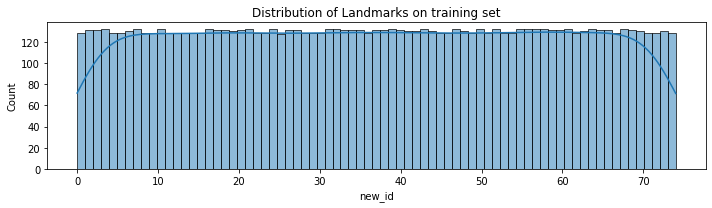

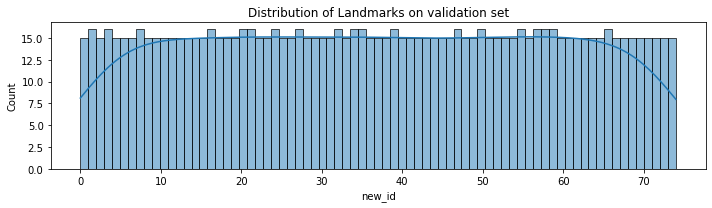

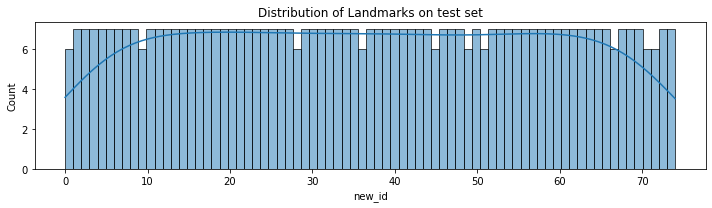

In [9]:
# Classes distribution on training, validation and test sets
plt.figure(figsize = (10, 3))
ax = sns.histplot(y_train, bins=75, kde = True)
ax.set_title('Distribution of Landmarks on training set')
plt.tight_layout()

plt.figure(figsize = (10, 3))
ax = sns.histplot(y_val, bins=75, kde = True)
ax.set_title('Distribution of Landmarks on validation set')
plt.tight_layout()

plt.figure(figsize = (10, 3))
ax = sns.histplot(y_test, bins=75, kde = True)
ax.set_title('Distribution of Landmarks on test set')
plt.tight_layout()
plt.show()

In [10]:
!rm -r train_sub, test_sub, val_sub && ls

rm: cannot remove 'train_sub,': No such file or directory
rm: cannot remove 'test_sub,': No such file or directory
rm: cannot remove 'val_sub': No such file or directory


In [11]:
# Creating image directories for classes subset
NEW_BASE_DIR = "/kaggle/working"

# Training set directory
for file, path, landmark in tqdm(zip(X_train['id'], X_train['path'], y_train)):
    dir = f"{NEW_BASE_DIR}/train_sub/{str(landmark)}"
    os.makedirs(dir, exist_ok = True)
    fname = f"{file}.jpg"
    shutil.copyfile(src = path, dst = f"{dir}/{fname}")

# Validation set directory    
for file, path, landmark in tqdm(zip(X_val['id'], X_val['path'], y_val)):
    dir = f"{NEW_BASE_DIR}/val_sub/{str(landmark)}"
    os.makedirs(dir, exist_ok = True)
    fname = f"{file}.jpg"
    shutil.copyfile(src = path, dst = f"{dir}/{fname}")

# Training set directory
for file, path, landmark in tqdm(zip(X_test['id'], X_test['path'], y_test)):
    dir = f"{NEW_BASE_DIR}/test_sub/{str(landmark)}"
    os.makedirs(dir, exist_ok = True)
    fname = f"{file}.jpg"
    shutil.copyfile(src = path, dst = f"{dir}/{fname}")

9779it [01:24, 115.78it/s]
1144it [00:09, 122.38it/s]
515it [00:04, 127.26it/s]


In [12]:
!ls

__notebook_source__.ipynb  test_sub  train_sub	val_sub


In [13]:
!cd train_sub && ls

0   12	16  2	23  27	30  34	38  41	45  49	52  56	6   63	67  70	74
1   13	17  20	24  28	31  35	39  42	46  5	53  57	60  64	68  71	8
10  14	18  21	25  29	32  36	4   43	47  50	54  58	61  65	69  72	9
11  15	19  22	26  3	33  37	40  44	48  51	55  59	62  66	7   73


In [15]:
# Creating tensorflow tf.data.Dataset
from tensorflow.keras.utils import image_dataset_from_directory

IMG_SIZE = 224
BATCH_SIZE = 16

print("Building training dataset...")
# Training tf.data.Dataset
train_ds = image_dataset_from_directory(f"{NEW_BASE_DIR}/train_sub",
                                        label_mode = 'int',
                                        shuffle = True,
                                        image_size = (IMG_SIZE, IMG_SIZE),
                                        batch_size = BATCH_SIZE)

print("Building validation dataset...")
# Validation tf.data.Dataset
val_ds = image_dataset_from_directory(f"{NEW_BASE_DIR}/val_sub",
                                        label_mode = 'int',
                                        shuffle = True,
                                        image_size = (IMG_SIZE, IMG_SIZE),
                                        batch_size = BATCH_SIZE)

print("Building test dataset...")
# Test tf.data.Dataset
test_ds = image_dataset_from_directory(f"{NEW_BASE_DIR}/test_sub",
                                        label_mode = 'int',
                                        shuffle = True,
                                        image_size = (IMG_SIZE, IMG_SIZE),
                                        batch_size = BATCH_SIZE)

Building training dataset...
Found 9779 files belonging to 75 classes.
Building validation dataset...
Found 1144 files belonging to 75 classes.
Building test dataset...
Found 515 files belonging to 75 classes.


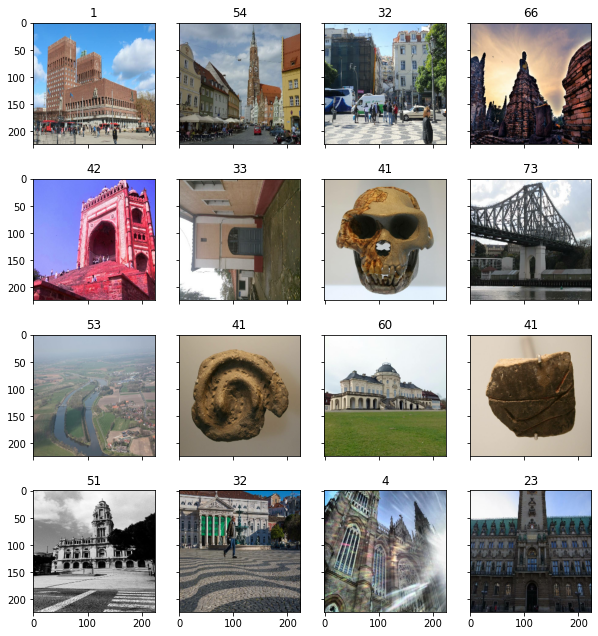

In [17]:
# Visualizing a random batch from training dataset
for data_batch, labels_batch in train_ds.take(1):
    ncols = 4
    nrows = int(data_batch.shape[0]/ncols)
    fig, ax = plt.subplots(nrows = nrows, ncols = ncols, figsize=(10, 11),
                           sharex = True, sharey = True)
    img_counter = 0
    for image, label in zip(data_batch, labels_batch):
        axi = ax.flat[img_counter]
        axi.imshow(image/255.)
        label = label.numpy()
#         axi.set_title(np.where(label == 1)[0])
        axi.set_title(label)
        img_counter += 1
plt.show()

In [ ]:
####### ALTERNATIVE CODE FOR UNBATCHED DATASET #######
# ncols = 4
# nrows = 4
# fig, ax = plt.subplots(nrows = nrows, ncols = ncols, figsize=(10, 11),
#                        sharex = True, sharey = True)
# img_counter = 0
# for image, label in train_ds.take(16):
#     axi = ax.flat[img_counter]
#     axi.imshow(image[0]/255.)
#     label = label.numpy()
# #         axi.set_title(np.where(label == 1)[0])
#     axi.set_title(label)
#     img_counter += 1
# plt.show()

In [18]:
# Defining a data augmentation stage
img_augmentation = tf.keras.Sequential(
    # [layers.RandomFlip("horizontal"),
    [layers.RandomTranslation(height_factor = 0.1, width_factor = 0.1),
     layers.RandomRotation(0.02),
     layers.RandomZoom(0.2)],
     name = "img_augmentation",
)

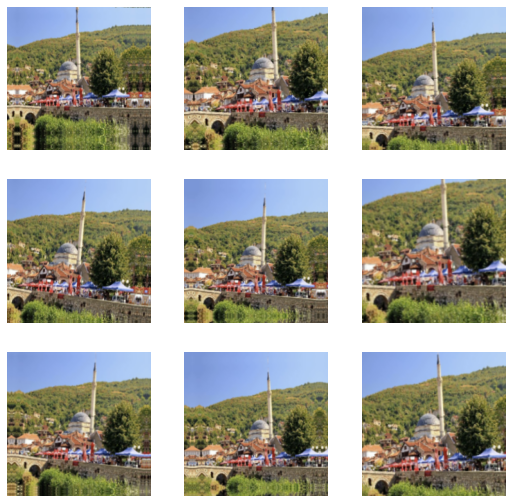

In [19]:
# Displaying variations of a randomly augmented training image
plt.figure(figsize=(9, 9))
for image, label in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        augmented_image = img_augmentation(image, training = True)
        plt.imshow(augmented_image[15].numpy().astype("uint8"))
        plt.axis("off")

In [ ]:
####### ALTERNATIVE CODE FOR UNBATCHED DATASET #######
# # Displaying variations of a randomly augmented training image
# plt.figure(figsize=(9, 9))
# for image, label in train_ds.take(16):
#     for i in range(9):
#         ax = plt.subplot(3, 3, i + 1)
#         augmented_image = img_augmentation(image[0], training = True)
#         plt.imshow(augmented_image.numpy().astype("uint8"))
#         plt.axis("off")

In [20]:
# Model
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.applications import EfficientNetB0

MODELS_DIR = f"{NEW_BASE_DIR}/models"

os.makedirs(MODELS_DIR, exist_ok = True)

# Model instantiator
def build_model(num_classes = None):
    inputs = keras.Input(shape = (IMG_SIZE, IMG_SIZE, 3))
    x = img_augmentation(inputs)
    # EfficientNetB0 backbone
    model = EfficientNetB0(input_tensor = x,
                           weights = 'imagenet',
                           include_top = False,
                           drop_connect_rate = DROP_CONNECT_RATE)
    
    # Freeze pretrained weights
    model.trainable = False
    
    # Rebuild top
    x = layers.GlobalAveragePooling2D(name = "avg_pool")(model.output)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(TOP_DROPOUT_RATE, name = "top_dropout")(x)
    
    # Embedding
    embedding = layers.Dense(512, name = "embedding_512")(x)
    outputs = layers.Dense(num_classes, activation = "softmax", name = "softmax")(embedding)
    
    # Compile
    model = tf.keras.Model(inputs, outputs, name = "EfficientNetB0")
    optimizer = tf.keras.optimizers.Adam(learning_rate = ADAM_LR)
    model.compile(optimizer = optimizer,
                 loss = "sparse_categorical_crossentropy",
                 metrics = ["accuracy"])
    
    return model

In [ ]:
# # Model summaries
# tf.keras.utils.plot_model(model)
# model.summary()

In [21]:
# Training history visualization
def plot_hist(hist):
    plt.plot(hist.history["accuracy"])
    plt.plot(hist.history["val_accuracy"])
    plt.title("model accuracy")
    plt.ylabel("accuracy")
    plt.xlabel("epoch")
    plt.legend(["train", "validation"], loc="upper left")
    plt.show()

In [180]:
# Instantiating model
# Hyperparameters
DROP_CONNECT_RATE = 0.2 # Dropout rate for stochastic depth on EfficientNet
TOP_DROPOUT_RATE = 0.2  # Top dropout
INIT_LR = 5e-3          # Initial learning rate
EPOCHS = 20
# Adam optimizer learning rate schedule
ADAM_LR = tf.keras.optimizers.schedules.ExponentialDecay(
    INIT_LR,
    decay_steps=100,
    decay_rate=0.96,
    staircase=True)

model = build_model(num_classes = NUM_CLASSES)

In [23]:
!ls

__notebook_source__.ipynb  models  test_sub  train_sub	val_sub


Epoch 1/20
612/612 [==============================] - 37s 51ms/step - loss: 6.5630 - accuracy: 0.5148 - val_loss: 3.7369 - val_accuracy: 0.6888


/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 2/20
612/612 [==============================] - 31s 51ms/step - loss: 3.4474 - accuracy: 0.6681 - val_loss: 2.0956 - val_accuracy: 0.7920
Epoch 3/20
612/612 [==============================] - 30s 49ms/step - loss: 2.0389 - accuracy: 0.7508 - val_loss: 1.4107 - val_accuracy: 0.8278
Epoch 4/20
612/612 [==============================] - 31s 50ms/step - loss: 1.3817 - accuracy: 0.7894 - val_loss: 1.1720 - val_accuracy: 0.8531
Epoch 5/20
612/612 [==============================] - 31s 50ms/step - loss: 0.9811 - accuracy: 0.8221 - val_loss: 0.8965 - val_accuracy: 0.8671
Epoch 6/20
612/612 [==============================] - 31s 50ms/step - loss: 0.7639 - accuracy: 0.8443 - val_loss: 0.8425 - val_accuracy: 0.8671
Epoch 7/20
612/612 [==============================] - 31s 50ms/step - loss: 0.6664 - accuracy: 0.8604 - val_loss: 0.7600 - val_accuracy: 0.8767
Epoch 8/20
612/612 [==============================] - 31s 50ms/step - loss: 0.5007 - accuracy: 0.8823 - val_loss: 0.6799 - val_accuracy:

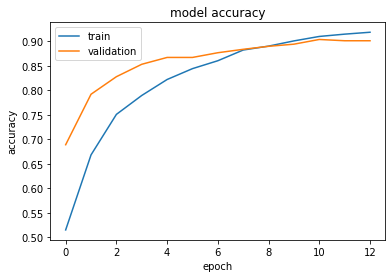

In [181]:
# Training embedding layer
model_file_path = os.path.join(MODELS_DIR, "EfficientNetB0_softmax.keras")
callbacks = [
    keras.callbacks.ModelCheckpoint(model_file_path,
                                    save_best_only=True,
                                    monitor = "val_accuracy"),
    keras.callbacks.EarlyStopping(patience = 2,
                                  monitor = "val_accuracy")]

hist = model.fit(train_ds,
                 epochs = EPOCHS,
                 validation_data = val_ds,
                 shuffle = 'batch',
                 callbacks = callbacks)

plot_hist(hist)

In [182]:
# Evaluating best model
model = keras.models.load_model(model_file_path)
print("Predictions on validation set...")
print(f"Validation accuracy: {model.evaluate(val_ds)[1]*100:.2f} %")
print("Predictions on test set...")
print(f"Test accuracy: {model.evaluate(test_ds)[1]*100:.2f} %")

Predictions on validation set...
72/72 [==============================] - 5s 39ms/step - loss: 0.9493 - accuracy: 0.8418
Validation accuracy: 84.18 %
Predictions on test set...
33/33 [==============================] - 2s 36ms/step - loss: 1.1063 - accuracy: 0.8408
Test accuracy: 84.08 %


### EfficientNetB7

In [ ]:
# Evaluating best model
# model = keras.models.load_model(os.path.join(MODELS_DIR, "EfficientNetB7_softmax.keras"))
# print("Predictions on validation set...")
# print(f"Validation accuracy: {model.evaluate(val_ds)[1]*100:.2f} %")
# print("Predictions on test set...")
# print(f"Test accuracy: {model.evaluate(test_ds)[1]*100:.2f} %")

### EfficientNetB3

In [ ]:
# Evaluating best model
# model = keras.models.load_model(os.path.join(MODELS_DIR, "EfficientNetB3_softmax.keras"))
# print("Predictions on validation set...")
# print(f"Validation accuracy: {model.evaluate(val_ds)[1]*100:.2f} %")
# print("Predictions on test set...")
# print(f"Test accuracy: {model.evaluate(test_ds)[1]*100:.2f} %")

### EfficientNetB0

In [ ]:
# Evaluating best model
# model = keras.models.load_model(os.path.join(MODELS_DIR, "EfficientNetB0_softmax.keras"))
# print("Predictions on validation set...")
# print(f"Validation accuracy: {model.evaluate(val_ds)[1]*100:.2f} %")
# print("Predictions on test set...")
# print(f"Test accuracy: {model.evaluate(test_ds)[1]*100:.2f} %")

## Cosine Similarity
Pairwise query: key search for similarity candidates. In the following example:
* Query images: validation set
* Key images: training set

In [27]:
# Auxiliar functions
# Load image
def get_image(path, resize = False, reshape = False, target_size = None):
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    if resize:
        img = cv2.resize(img, dsize = (target_size, target_size))
    if reshape:
        img = tf.reshape(img, [1, target_size, target_size, 3])
    return img

# Get landmark samples
def get_landmark(landmark_id, samples = 16):
    nrows = samples // 4
    random_imgs = np.random.choice(train_df_sub[train_df_sub['new_id'] == landmark_id].index, samples, replace = False)
    plt.figure(figsize = (12, 10))
    for i, img in enumerate(train_df_sub.loc[random_imgs, :].values):
        ax = plt.subplot(nrows, 4, i + 1)
        plt.imshow(get_image(img[2]))
        plt.title(f"{img[0]}")
        plt.suptitle(f"Samples of landmark {landmark_id}", fontsize = 14, y = 0.94, weight = "bold")
        plt.axis("off")

# Get image embeddings
def get_embeddings(model, image_paths, input_size, as_df = True):
    embeddings = {}
    embeddings['images_paths'] = []
    embeddings['embedded_images'] = []
    
    target_dir = os.path.split(os.path.split(image_paths[0])[0])[0]
    
    print(f"Retrieving embeddings for {target_dir} with {model.name}...")
    for image_path in tqdm(image_paths):
        embeddings['images_paths'].append(image_path)
        embedded_image = model.predict(get_image(image_path,
                                                 resize = True,
                                                 reshape = True,
                                                 target_size = input_size))
        embeddings['embedded_images'].append(embedded_image)
    
    if as_df:
        embeddings = pd.DataFrame(embeddings)
    
    return embeddings

# Get similarities between query key pair
def get_similarities(query, key):
    '''
    Get cosine similarity matrix between query and key pairs
    Arguments:
    query, key: embedded images
    '''
    query_array = np.stack(query.tolist()).reshape(query.shape[0],
                                                   query[0].shape[1])
    key_array = np.stack(key.tolist()).reshape(key.shape[0],
                                               key[0].shape[1])
    
    # Initializing similarity matrix
    similarity = np.zeros((query_array.shape[0], key_array.shape[0]))
    
    # Getting pairwise similarities
    print(f"Getting pairwise {query_array.shape[0]} query: {key_array.shape[0]} key similarities...")
    for query_index in tqdm(range(query_array.shape[0])):
        similarity[query_index] = 1 - spatial.distance.cdist(query_array[np.newaxis, query_index, :],
                                                             key_array,
                                                             'cosine')[0]
    return similarity

# Plot top ranked images
def plot_similar(similar_imgs, img_paths):
    '''
    Plot top N similar samples from similarity index
    '''
    plt.figure(figsize = (18, 6))
    nrows = similar_imgs.shape[0]//5
    for i, img in enumerate(similar_imgs):
        ax = plt.subplot(nrows, 5, i + 1)
        plt.imshow(get_image(img_paths[img]))
        plt.title(f"Landmark id: {os.path.split(os.path.split(img_paths[img])[0])[1]}")
        plt.axis("off")

In [183]:
# Embedding models
embedding_layer = 'embedding_512'
embedding_model = tf.keras.Model(inputs = model.input,
                                 outputs = model.get_layer(embedding_layer).output,
                                 name = "EfficientNetB0_embed512")

In [184]:
# Retrieving embeddings
train_img_paths = train_ds.file_paths
val_img_paths = val_ds.file_paths

train_embeddings = get_embeddings(model = embedding_model,
                                 image_paths = train_img_paths,
                                 input_size = IMG_SIZE)

val_embeddings = get_embeddings(model = embedding_model,
                                 image_paths = val_img_paths,
                                 input_size = IMG_SIZE)

Retrieving embeddings for /kaggle/working/train_sub with EfficientNetB0_embed512...


100%|██████████| 9779/9779 [08:10<00:00, 19.93it/s]


Retrieving embeddings for /kaggle/working/val_sub with EfficientNetB0_embed512...


100%|██████████| 1144/1144 [00:57<00:00, 19.88it/s]


In [30]:
train_embeddings.head()

,images_paths,embedded_images
0,/kaggle/working/train_sub/66/aae503a2fec3c576.jpg,"[[0.0026905239, 1.9844834, 0.59835494, 1.29317..."
1,/kaggle/working/train_sub/27/333b488655772eb7.jpg,"[[2.9021702, 2.6925182, 1.7677113, -5.194401, ..."
2,/kaggle/working/train_sub/46/720421c7634914f7.jpg,"[[-1.232312, 1.9092644, 0.3758431, 1.5597296, ..."
3,/kaggle/working/train_sub/40/f55f0ff4af9f5a97.jpg,"[[1.4481058, 1.1002406, -0.922333, -2.1203527,..."
4,/kaggle/working/train_sub/54/001f638c79cc07f9.jpg,"[[-0.43415046, 2.6843486, 0.5288707, 1.055402,..."


In [31]:
val_embeddings.head()

,images_paths,embedded_images
0,/kaggle/working/val_sub/56/62e94b1ab850ecb7.jpg,"[[1.1595515, 2.2759826, 1.9211183, 1.5029302, ..."
1,/kaggle/working/val_sub/3/99c4d0b336c3725a.jpg,"[[-0.14892617, -0.86927116, -0.90562487, -0.11..."
2,/kaggle/working/val_sub/10/8bd931f212ed57f2.jpg,"[[0.53329736, -1.6385573, -0.29206258, 1.07585..."
3,/kaggle/working/val_sub/41/b4ae4eb12aac8e09.jpg,"[[0.932957, 0.64012957, 0.16890366, 1.9878387,..."
4,/kaggle/working/val_sub/23/31e0fb0f23d16b65.jpg,"[[1.433919, 0.70212847, -1.2751719, 0.07661068..."


In [185]:
val_train_similarity = get_similarities(val_embeddings['embedded_images'],
                                        train_embeddings['embedded_images'])
val_train_similarity.shape

Getting pairwise 1144 query: 9779 key similarities...


100%|██████████| 1144/1144 [00:18<00:00, 62.57it/s]


(1144, 9779)

In [33]:
# Calculating confidence score per submission
def confidence_top(query = None, key = None, similarity = None, query_image_index = None, top = 5):
    '''
    Arguments:
    query_image_index = index of query image on similarity matrix query axis
    Return confidence scores for top N predictions
    '''
    query_paths = query['images_paths']
    key_paths = key['images_paths']
    
    similar_n = np.argsort(similarity[query_image_index])[::-1][:top]
    
    confidence_df = {}    
    confidence_df['top_similar'] = []
    for similar in similar_n:
        confidence_df['top_similar'].append(similar)

    confidence_df['image_paths'] = []
    for similar in similar_n:
        similar_image_path = key_paths[similar]
        confidence_df['image_paths'].append(similar_image_path)    
        
    confidence_df['prediction'] = []
    for similar in similar_n:
        similar_image_path = key_paths[similar]
        y = int(os.path.split(os.path.split(similar_image_path)[0])[1])
        confidence_df['prediction'].append(y)  
    
    confidence_df['cos_similarity'] = []
    for similar in similar_n:
        confidence_df['cos_similarity'].append(similarity[query_image_index][similar]) 
    
    return pd.DataFrame(confidence_df)

Queried image: 62e94b1ab850ecb7.jpg


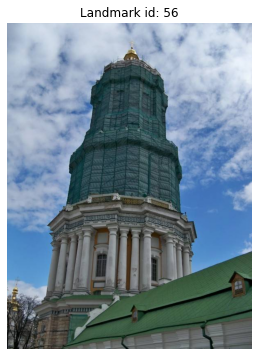

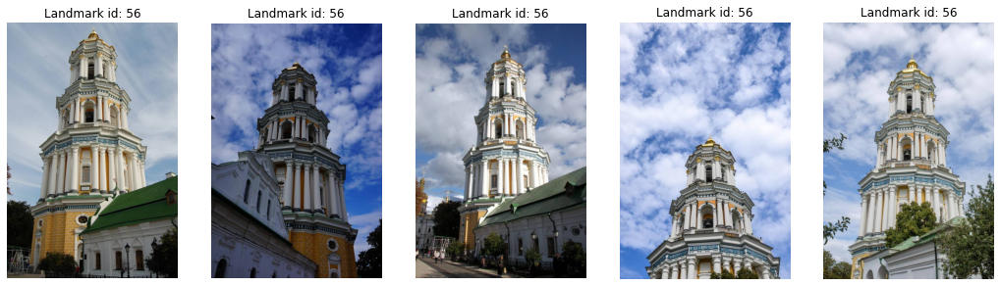

In [38]:
query_image_index = 0
top_n = 5

image_id = os.path.split(val_embeddings['images_paths'][query_image_index])[1]
query_landmark_id = os.path.split(os.path.split(val_embeddings['images_paths'][query_image_index])[0])[1]

similar_n = np.argsort(val_train_similarity[query_image_index])[::-1][:top_n]

print(f"Queried image: {image_id}")
plt.figure(figsize = (6, 6))
plt.imshow(get_image(val_embeddings['images_paths'][query_image_index]))
plt.title(f"Landmark id: {query_landmark_id}")
plt.axis("off")
plot_similar(similar_n, train_embeddings['images_paths'])

In [39]:
confidence_df = confidence_top(query = val_embeddings,
                               key = train_embeddings,
                               similarity = val_train_similarity,
                               query_image_index = query_image_index,
                               top = top_n)

confidence_df

,top_similar,image_paths,prediction,cos_similarity
0,9078,/kaggle/working/train_sub/56/d03c3746c257d75e.jpg,56,0.817019
1,3058,/kaggle/working/train_sub/56/ad660b5860666b7a.jpg,56,0.805385
2,6848,/kaggle/working/train_sub/56/d04d5ecbcfd75ea5.jpg,56,0.775327
3,1317,/kaggle/working/train_sub/56/4bda19791ae095fb.jpg,56,0.768819
4,1323,/kaggle/working/train_sub/56/69bf80dff5ceb1c0.jpg,56,0.757135


Queried image: 31e0fb0f23d16b65.jpg


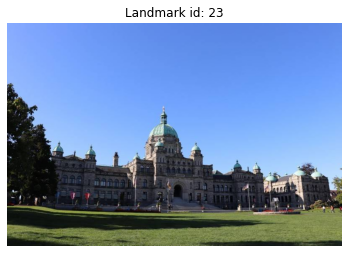

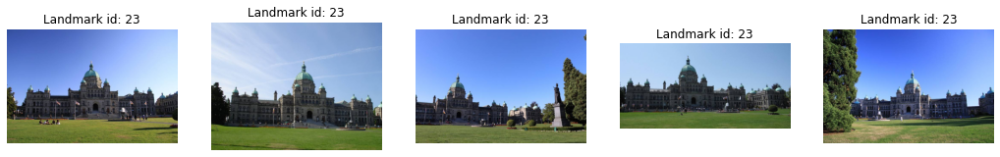

In [84]:
query_image_index = 4
top_n = 5

image_id = os.path.split(val_embeddings['images_paths'][query_image_index])[1]
query_landmark_id = os.path.split(os.path.split(val_embeddings['images_paths'][query_image_index])[0])[1]

similar_n = np.argsort(val_train_similarity[query_image_index])[::-1][:top_n]

print(f"Queried image: {image_id}")
plt.figure(figsize = (6, 6))
plt.imshow(get_image(val_embeddings['images_paths'][query_image_index]))
plt.title(f"Landmark id: {query_landmark_id}")
plt.axis("off")
plot_similar(similar_n, train_embeddings['images_paths'])

In [85]:
confidence_df = confidence_top(query = val_embeddings,
                               key = train_embeddings,
                               similarity = val_train_similarity,
                               query_image_index = query_image_index,
                               top = top_n)

confidence_df

,top_similar,image_paths,prediction,cos_similarity
0,858,/kaggle/working/train_sub/23/cd73ea5b384c6657.jpg,23,0.880381
1,6855,/kaggle/working/train_sub/23/b3f6864e51b4a69d.jpg,23,0.878890
2,288,/kaggle/working/train_sub/23/4c1fb47b2c2441ff.jpg,23,0.875651
3,3884,/kaggle/working/train_sub/23/a1b7832fa9f192cc.jpg,23,0.874943
4,1217,/kaggle/working/train_sub/23/fe1216574c3622ff.jpg,23,0.868765


Queried image: 05cfff9f87de0cc8.jpg


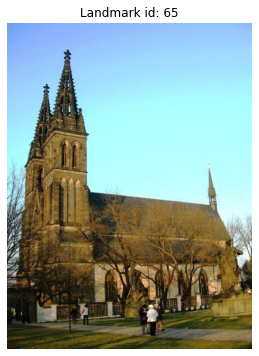

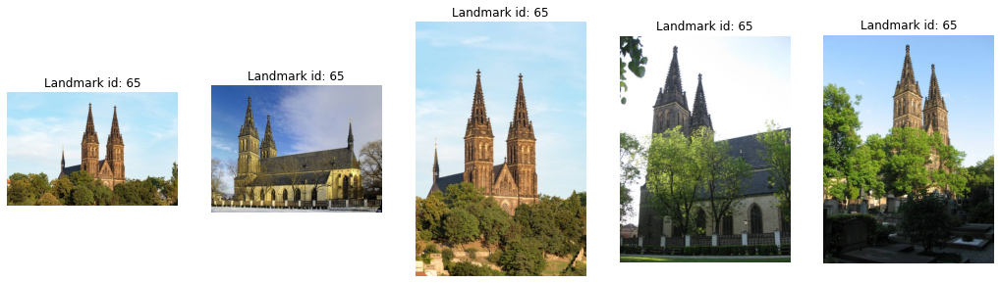

In [86]:
query_image_index = 5
top_n = 5

image_id = os.path.split(val_embeddings['images_paths'][query_image_index])[1]
query_landmark_id = os.path.split(os.path.split(val_embeddings['images_paths'][query_image_index])[0])[1]

similar_n = np.argsort(val_train_similarity[query_image_index])[::-1][:top_n]

print(f"Queried image: {image_id}")
plt.figure(figsize = (6, 6))
plt.imshow(get_image(val_embeddings['images_paths'][query_image_index]))
plt.title(f"Landmark id: {query_landmark_id}")
plt.axis("off")
plot_similar(similar_n, train_embeddings['images_paths'])

In [87]:
confidence_df = confidence_top(query = val_embeddings,
                               key = train_embeddings,
                               similarity = val_train_similarity,
                               query_image_index = query_image_index,
                               top = top_n)

confidence_df

,top_similar,image_paths,prediction,cos_similarity
0,8782,/kaggle/working/train_sub/65/1913f6fbe7354350.jpg,65,0.842571
1,1629,/kaggle/working/train_sub/65/9050f7c3c53e89b7.jpg,65,0.833673
2,9368,/kaggle/working/train_sub/65/18f8cec68e7d6914.jpg,65,0.833432
3,3807,/kaggle/working/train_sub/65/b7e4db37fdae6882.jpg,65,0.830104
4,9330,/kaggle/working/train_sub/65/a6ae9ea169bbc33f.jpg,65,0.821917


Queried image: f5cce3ff89037a9f.jpg


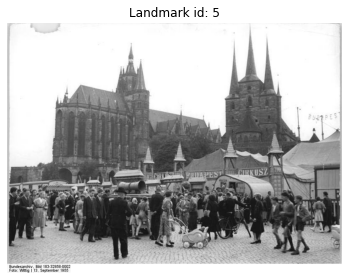

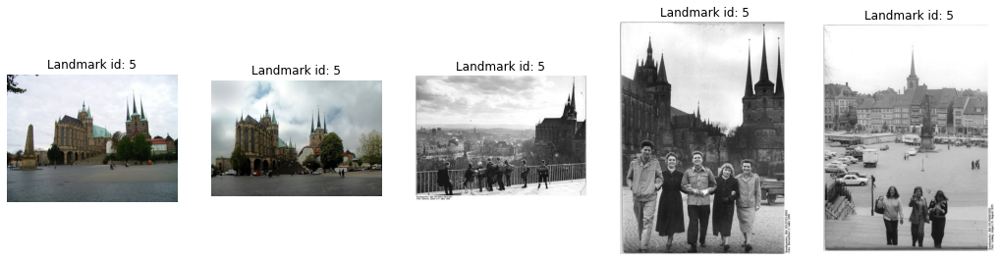

In [96]:
query_image_index = 11
top_n = 5

image_id = os.path.split(val_embeddings['images_paths'][query_image_index])[1]
query_landmark_id = os.path.split(os.path.split(val_embeddings['images_paths'][query_image_index])[0])[1]

similar_n = np.argsort(val_train_similarity[query_image_index])[::-1][:top_n]

print(f"Queried image: {image_id}")
plt.figure(figsize = (6, 6))
plt.imshow(get_image(val_embeddings['images_paths'][query_image_index]))
plt.title(f"Landmark id: {query_landmark_id}")
plt.axis("off")
plot_similar(similar_n, train_embeddings['images_paths'])

In [97]:
confidence_df = confidence_top(query = val_embeddings,
                               key = train_embeddings,
                               similarity = val_train_similarity,
                               query_image_index = query_image_index,
                               top = top_n)

confidence_df

,top_similar,image_paths,prediction,cos_similarity
0,4283,/kaggle/working/train_sub/5/34f302a4f189461b.jpg,5,0.811949
1,3877,/kaggle/working/train_sub/5/d2b3f7b04a6a344e.jpg,5,0.773697
2,657,/kaggle/working/train_sub/5/66058ba3d0b0a575.jpg,5,0.760843
3,4512,/kaggle/working/train_sub/5/f017b85a0f52b799.jpg,5,0.739678
4,7388,/kaggle/working/train_sub/5/6ae2ec9b9603a817.jpg,5,0.729040


Queried image: 06b257e59c5aaa2d.jpg


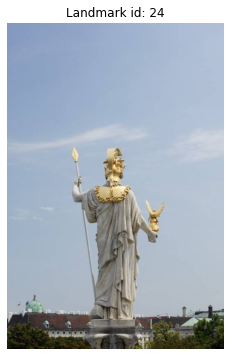

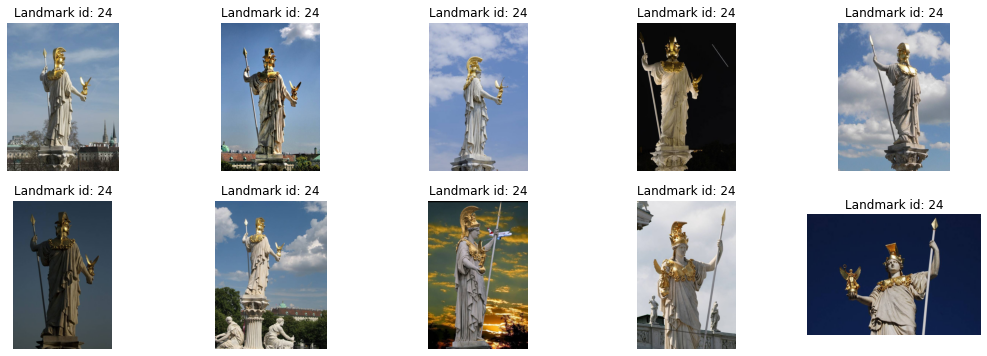

In [210]:
query_image_index = 92
top_n = 10

image_id = os.path.split(val_embeddings['images_paths'][query_image_index])[1]
query_landmark_id = os.path.split(os.path.split(val_embeddings['images_paths'][query_image_index])[0])[1]

similar_n = np.argsort(val_train_similarity[query_image_index])[::-1][:top_n]

print(f"Queried image: {image_id}")
plt.figure(figsize = (6, 6))
plt.imshow(get_image(val_embeddings['images_paths'][query_image_index]))
plt.title(f"Landmark id: {query_landmark_id}")
plt.axis("off")
plot_similar(similar_n, train_embeddings['images_paths'])

In [211]:
confidence_df = confidence_top(query = val_embeddings,
                               key = train_embeddings,
                               similarity = val_train_similarity,
                               query_image_index = query_image_index,
                               top = top_n)

confidence_df

,top_similar,image_paths,prediction,cos_similarity
0,4443,/kaggle/working/train_sub/24/4252ee2f84db6cf4.jpg,24,0.875248
1,7588,/kaggle/working/train_sub/24/84fb37b044f90b04.jpg,24,0.853770
2,980,/kaggle/working/train_sub/24/45839b669eb4b770.jpg,24,0.795675
3,741,/kaggle/working/train_sub/24/e27924b1e5a2c50a.jpg,24,0.790883
4,823,/kaggle/working/train_sub/24/4160e4c57ab9db65.jpg,24,0.741144
5,1664,/kaggle/working/train_sub/24/ba721ae6af4556aa.jpg,24,0.728024
6,3787,/kaggle/working/train_sub/24/cb87c9940756eec3.jpg,24,0.726932
7,6029,/kaggle/working/train_sub/24/90569ba129689a8f.jpg,24,0.700625
8,5602,/kaggle/working/train_sub/24/779e77bb34217b0f.jpg,24,0.663874
9,4969,/kaggle/working/train_sub/24/8ee7980062bff05e.jpg,24,0.660096


## Object oclusion example
Object oclusion is only one of the examples of how a local feature reranking method improves query performance

Queried image: 0088010eecd2ef45.jpg


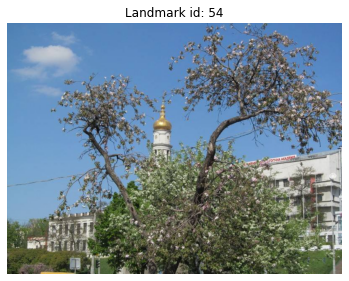

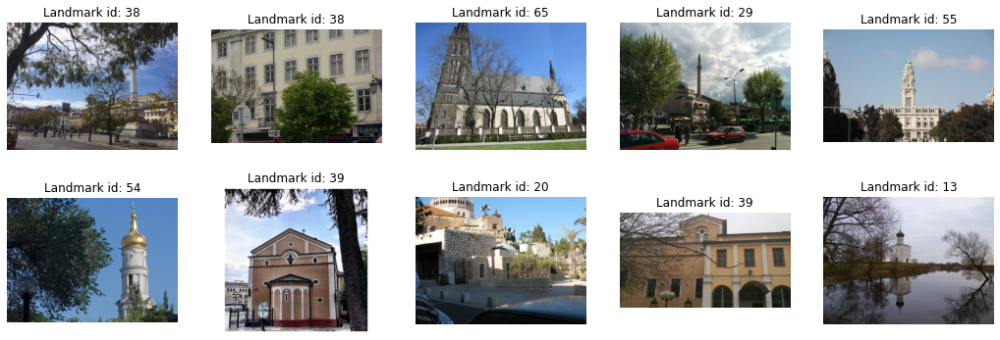

In [196]:
query_image_index = 573
top_n = 10

image_id = os.path.split(val_embeddings['images_paths'][query_image_index])[1]
query_landmark_id = os.path.split(os.path.split(val_embeddings['images_paths'][query_image_index])[0])[1]

similar_n = np.argsort(val_train_similarity[query_image_index])[::-1][:top_n]

print(f"Queried image: {image_id}")
plt.figure(figsize = (6, 6))
plt.imshow(get_image(val_embeddings['images_paths'][query_image_index]))
plt.title(f"Landmark id: {query_landmark_id}")
plt.axis("off")
plot_similar(similar_n, train_embeddings['images_paths'])

In [197]:
confidence_df = confidence_top(query = val_embeddings,
                               key = train_embeddings,
                               similarity = val_train_similarity,
                               query_image_index = query_image_index,
                               top = top_n)

confidence_df

,top_similar,image_paths,prediction,cos_similarity
0,8462,/kaggle/working/train_sub/38/ac9ba0e00ab4ced1.jpg,38,0.628021
1,9714,/kaggle/working/train_sub/38/af72e7cffa004cdf.jpg,38,0.591407
2,323,/kaggle/working/train_sub/65/b68359e5daa6f5c2.jpg,65,0.569240
3,1525,/kaggle/working/train_sub/29/c1a698ed0c00e40a.jpg,29,0.562543
4,2097,/kaggle/working/train_sub/55/3b30f9e0c610ef34.jpg,55,0.562360
5,8590,/kaggle/working/train_sub/54/27c5e3e7cd4757c6.jpg,54,0.528295
6,429,/kaggle/working/train_sub/39/c116f8a0446b61d5.jpg,39,0.527410
7,7012,/kaggle/working/train_sub/20/8f53b4e12442070a.jpg,20,0.527058
8,794,/kaggle/working/train_sub/39/c601cce7002793b7.jpg,39,0.507840
9,5002,/kaggle/working/train_sub/13/86a9570d49a71aa1.jpg,13,0.503478


## DELF module
Local features search

References:
* Large-Scale Image Retrieval with Attentive Deep Local Features: https://arxiv.org/abs/1612.06321
* DELF on Tensorflow Hub: https://github.com/tensorflow/models/tree/master/research/delf


In [42]:
DELF_IMG_SIZE = 600

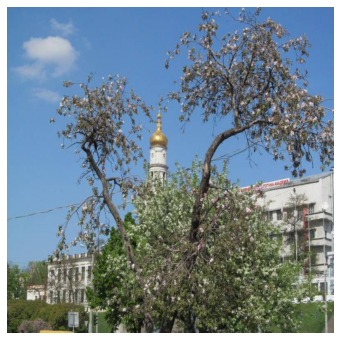

In [190]:
image_1 = get_image(val_embeddings['images_paths'][573],
                    resize = True,
                    target_size = DELF_IMG_SIZE)

plt.figure(figsize = (6, 6))
plt.imshow(image_1)
plt.axis("off")
plt.show()

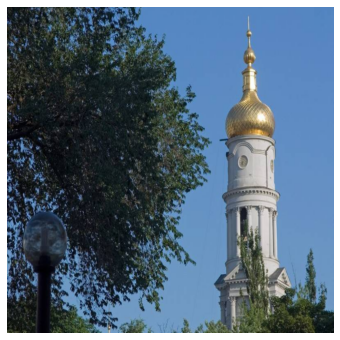

In [191]:
image_2 = get_image(train_embeddings['images_paths'][similar_n[5]],
                     resize = True,
                     target_size = DELF_IMG_SIZE)

plt.figure(figsize = (6, 6))
plt.imshow(image_2)
plt.axis("off")
plt.show()

In [46]:
from absl import logging
from PIL import Image, ImageOps
from scipy.spatial import cKDTree
from skimage.feature import plot_matches
from skimage.measure import ransac
from skimage.transform import AffineTransform
from six import BytesIO

import tensorflow_hub as hub
from six.moves.urllib.request import urlopen

In [47]:
delf = hub.load('https://tfhub.dev/google/delf/1').signatures['default']

In [48]:
# DELF module
def run_delf(image):
    '''
    Apply DELF module to the input image
    Arguments:
    image: np.array resized image
    '''
    float_image = tf.image.convert_image_dtype(image, tf.float32)

    return delf(
      image = float_image,
      score_threshold = tf.constant(100.0),
      image_scales = tf.constant([0.25, 0.3536, 0.5, 0.7071, 1.0, 1.4142, 2.0]),
      max_feature_num = tf.constant(1000))

def match_images(image1, image2, result1, result2, verbose = True):
    distance_threshold = 0.8

    # Read features.
    num_features_1 = result1['locations'].shape[0]
    num_features_2 = result2['locations'].shape[0]
    
    if verbose:
        print("Loaded image 1's %d features" % num_features_1)
        print("Loaded image 2's %d features" % num_features_2)

    # Find nearest-neighbor matches using a KD tree.
    d1_tree = cKDTree(result1['descriptors'])
    _, indices = d1_tree.query(
      result2['descriptors'],
      distance_upper_bound=distance_threshold)

    # Select feature locations for putative matches.
    locations_2_to_use = np.array([
      result2['locations'][i,]
      for i in range(num_features_2)
      if indices[i] != num_features_1
    ])
    locations_1_to_use = np.array([
      result1['locations'][indices[i],]
      for i in range(num_features_2)
      if indices[i] != num_features_1
    ])

    # Perform geometric verification using RANSAC.
    _, inliers = ransac(
      (locations_1_to_use, locations_2_to_use),
      AffineTransform,
      min_samples=3,
      residual_threshold=20,
      max_trials=1000)
    
    if verbose:
        print('Found %d inliers' % sum(inliers))

    # Visualize correspondences.
    _, ax = plt.subplots(figsize = (9, 9))
    inlier_idxs = np.nonzero(inliers)[0]
    plot_matches(
      ax,
      image1,
      image2,
      locations_1_to_use,
      locations_2_to_use,
      np.column_stack((inlier_idxs, inlier_idxs)),
      matches_color='b')
    ax.axis('off')
    ax.set_title(f'DELF correspondences: Found {sum(inliers)} inliers')

In [192]:
delf_result1 = run_delf(image_1)
delf_result2 = run_delf(image_2)

Loaded image 1's 294 features
Loaded image 2's 423 features
Found 63 inliers


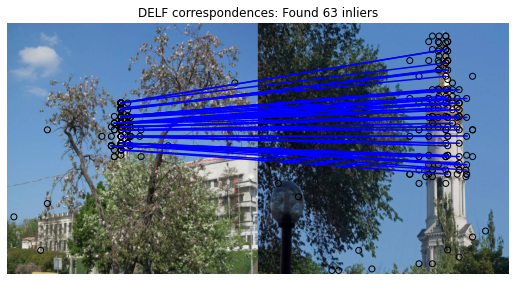

In [193]:
match_images(image_1, image_2, delf_result1, delf_result2)

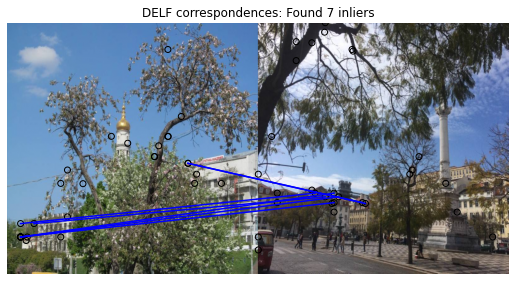

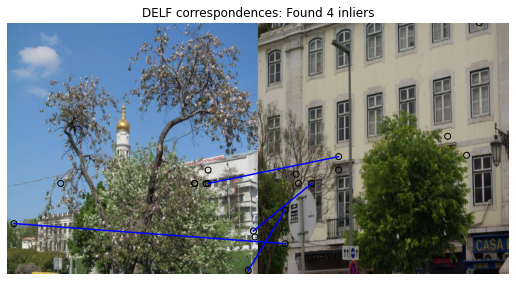

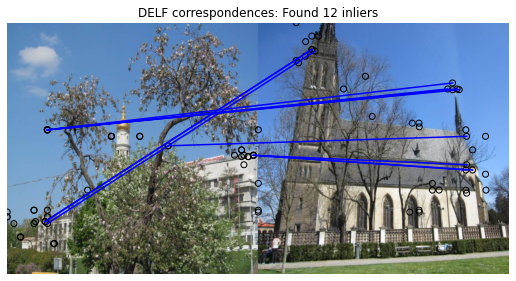

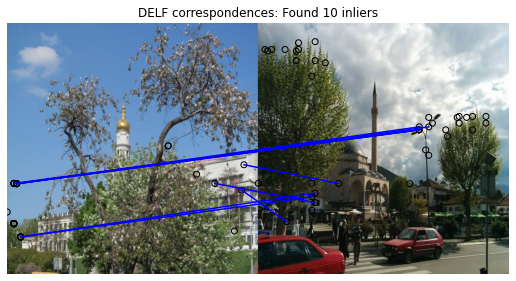

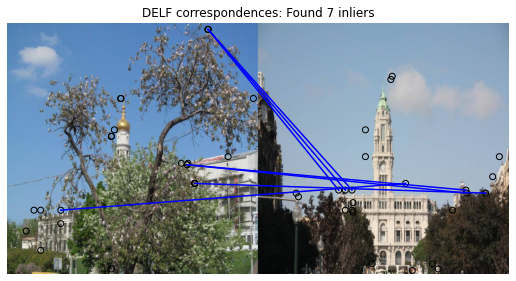

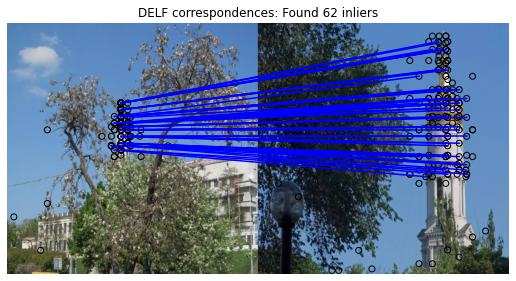

In [194]:
for image_index in similar_n[:6]:
    key_image = get_image(train_embeddings['images_paths'][image_index],
                          resize = True,
                          target_size = DELF_IMG_SIZE)
    delf_key_image_result = run_delf(key_image)
    match_images(image_1, key_image, delf_result1, delf_key_image_result, verbose = False)

## Reranking
Reranking using DELF local features descriptor

In [69]:
def delf_rerank(query = None, key = None, query_image_index = None, confidence_df = None, re_sort = True):
    distance_threshold = 0.8
    query_paths = query['images_paths']
    key_paths = key['images_paths']
    
    query_image = get_image(query_paths[query_image_index],
                            resize = True,
                            target_size = DELF_IMG_SIZE)
    
    delf_result_query = run_delf(query_image)
    
    # Read query features
    num_features_query = delf_result_query['locations'].shape[0]
    
    inliers_list = []
    print(f"Retrieving local features for top {len(confidence_df['image_paths'])} key images...")
    for image_path in tqdm(confidence_df['image_paths']):
        key_image = get_image(image_path,
                          resize = True,
                          target_size = DELF_IMG_SIZE)
        
        delf_result_key = run_delf(key_image)
    
        # Read key features
        num_features_key = delf_result_key['locations'].shape[0]

        # Find nearest-neighbor matches using a KD tree.
        d1_tree = cKDTree(delf_result_query['descriptors'])
        _, indices = d1_tree.query(
          delf_result_key['descriptors'],
          distance_upper_bound=distance_threshold)

        # Select feature locations for putative matches.
        locations_k_to_use = np.array([
          delf_result_key['locations'][i,]
          for i in range(num_features_key)
          if indices[i] != num_features_query
        ])
        locations_q_to_use = np.array([
          delf_result_query['locations'][indices[i],]
          for i in range(num_features_key)
          if indices[i] != num_features_query
        ])

        # Perform geometric verification using RANSAC.
        try:
            _, inliers = ransac(
              (locations_q_to_use, locations_k_to_use),
              AffineTransform,
              min_samples=3,
              residual_threshold=20,
              max_trials=1000)
        except:
            inliers = [0]
          
        total_inliers = sum(inliers)
        inliers_list.append(total_inliers)
    
    confidence_df['inliers'] = inliers_list
    
    original_confidence = confidence_df['inliers']
    reranked_confidence = np.sqrt(original_confidence) * confidence_df['cos_similarity']
    confidence_df['reranked_conf'] = reranked_confidence
    
    if re_sort:
        confidence_df.sort_values('reranked_conf', ascending = False, inplace = True)
    
    return confidence_df

In [198]:
reranked_df = delf_rerank(query = val_embeddings,
                          key = train_embeddings,
                          query_image_index = query_image_index,
                          confidence_df = confidence_df,
                          re_sort = True)
reranked_df

Retrieving local features for top 10 key images...


100%|██████████| 10/10 [00:09<00:00,  1.06it/s]


,top_similar,image_paths,prediction,cos_similarity,inliers,reranked_conf
5,8590,/kaggle/working/train_sub/54/27c5e3e7cd4757c6.jpg,54,0.528295,62,4.159800
2,323,/kaggle/working/train_sub/65/b68359e5daa6f5c2.jpg,65,0.569240,12,1.971906
9,5002,/kaggle/working/train_sub/13/86a9570d49a71aa1.jpg,13,0.503478,14,1.883842
3,1525,/kaggle/working/train_sub/29/c1a698ed0c00e40a.jpg,29,0.562543,9,1.687628
0,8462,/kaggle/working/train_sub/38/ac9ba0e00ab4ced1.jpg,38,0.628021,7,1.661588
6,429,/kaggle/working/train_sub/39/c116f8a0446b61d5.jpg,39,0.527410,8,1.491740
4,2097,/kaggle/working/train_sub/55/3b30f9e0c610ef34.jpg,55,0.562360,7,1.487865
8,794,/kaggle/working/train_sub/39/c601cce7002793b7.jpg,39,0.507840,6,1.243949
1,9714,/kaggle/working/train_sub/38/af72e7cffa004cdf.jpg,38,0.591407,4,1.182815
7,7012,/kaggle/working/train_sub/20/8f53b4e12442070a.jpg,20,0.527058,4,1.054116


Queried image: 0088010eecd2ef45.jpg


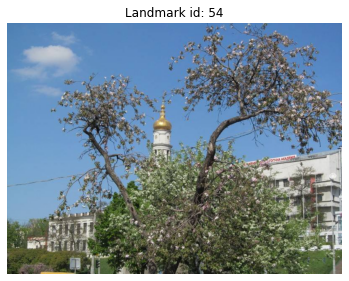

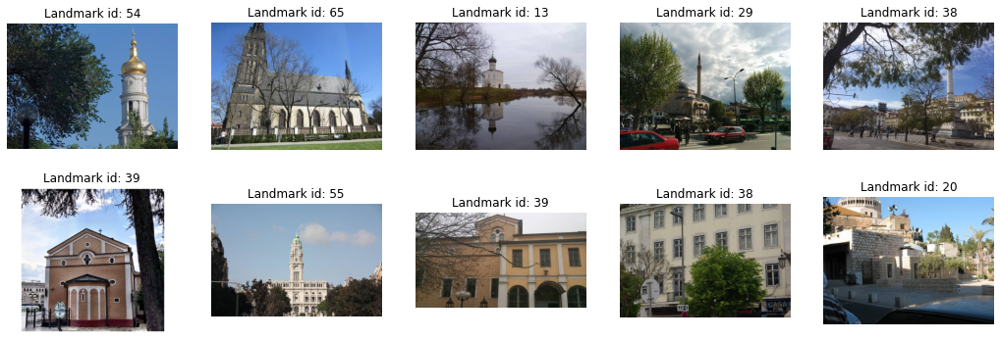

In [199]:
query_image_index = 573
top_n = 10

image_id = os.path.split(val_embeddings['images_paths'][query_image_index])[1]
query_landmark_id = os.path.split(os.path.split(val_embeddings['images_paths'][query_image_index])[0])[1]

similar_n = reranked_df['top_similar'][:top_n]

print(f"Queried image: {image_id}")
plt.figure(figsize = (6, 6))
plt.imshow(get_image(val_embeddings['images_paths'][query_image_index]))
plt.title(f"Landmark id: {query_landmark_id}")
plt.axis("off")
plot_similar(similar_n, train_embeddings['images_paths'])

## Reranking examples

Queried image: 99c4d0b336c3725a.jpg


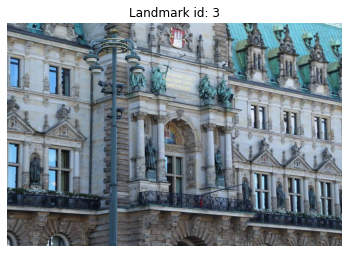

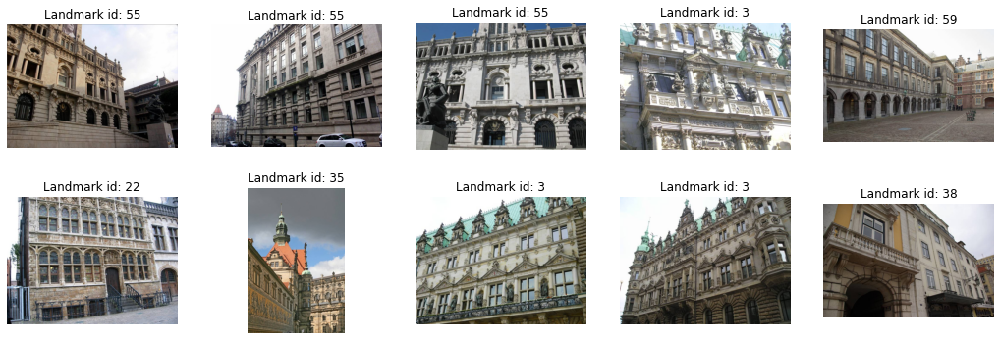

In [58]:
query_image_index = 1
top_n = 10

image_id = os.path.split(val_embeddings['images_paths'][query_image_index])[1]
query_landmark_id = os.path.split(os.path.split(val_embeddings['images_paths'][query_image_index])[0])[1]

similar_n = np.argsort(val_train_similarity[query_image_index])[::-1][:top_n]

print(f"Queried image: {image_id}")
plt.figure(figsize = (6, 6))
plt.imshow(get_image(val_embeddings['images_paths'][query_image_index]))
plt.title(f"Landmark id: {query_landmark_id}")
plt.axis("off")
plot_similar(similar_n, train_embeddings['images_paths'])

In [59]:
confidence_df = confidence_top(query = val_embeddings,
                               key = train_embeddings,
                               similarity = val_train_similarity,
                               query_image_index = query_image_index,
                               top = top_n)

confidence_df

,top_similar,image_paths,prediction,cos_similarity
0,3837,/kaggle/working/train_sub/55/6f3c0fdbc5025bed.jpg,55,0.673456
1,5428,/kaggle/working/train_sub/55/a496463fb5c6f735.jpg,55,0.671897
2,9130,/kaggle/working/train_sub/55/24528930457b8a00.jpg,55,0.654891
3,6174,/kaggle/working/train_sub/3/978d0656e8850f1c.jpg,3,0.614097
4,4451,/kaggle/working/train_sub/59/8910fe1e92090ae7.jpg,59,0.610814
5,9692,/kaggle/working/train_sub/22/79740c6946d9980b.jpg,22,0.605878
6,8353,/kaggle/working/train_sub/35/a45ef79729c0f473.jpg,35,0.603839
7,7667,/kaggle/working/train_sub/3/0f527a2836e53f88.jpg,3,0.597670
8,7514,/kaggle/working/train_sub/3/03d8283ab08c825b.jpg,3,0.596630
9,5371,/kaggle/working/train_sub/38/6071edbd010576b4.jpg,38,0.596334


In [60]:
reranked_df = delf_rerank(query = val_embeddings,
                          key = train_embeddings,
                          query_image_index = query_image_index,
                          confidence_df = confidence_df,
                          re_sort = True)
reranked_df

Retrieving local features for top 10 key images...


100%|██████████| 10/10 [00:10<00:00,  1.10s/it]


,top_similar,image_paths,prediction,cos_similarity,inliers,reranked_conf
7,7667,/kaggle/working/train_sub/3/0f527a2836e53f88.jpg,3,0.597670,46,4.053594
8,7514,/kaggle/working/train_sub/3/03d8283ab08c825b.jpg,3,0.596630,32,3.375050
0,3837,/kaggle/working/train_sub/55/6f3c0fdbc5025bed.jpg,55,0.673456,17,2.776729
2,9130,/kaggle/working/train_sub/55/24528930457b8a00.jpg,55,0.654891,13,2.361243
5,9692,/kaggle/working/train_sub/22/79740c6946d9980b.jpg,22,0.605878,14,2.266988
3,6174,/kaggle/working/train_sub/3/978d0656e8850f1c.jpg,3,0.614097,13,2.214159
1,5428,/kaggle/working/train_sub/55/a496463fb5c6f735.jpg,55,0.671897,10,2.124724
4,4451,/kaggle/working/train_sub/59/8910fe1e92090ae7.jpg,59,0.610814,12,2.115923
6,8353,/kaggle/working/train_sub/35/a45ef79729c0f473.jpg,35,0.603839,11,2.002706
9,5371,/kaggle/working/train_sub/38/6071edbd010576b4.jpg,38,0.596334,11,1.977818


Queried image: 99c4d0b336c3725a.jpg


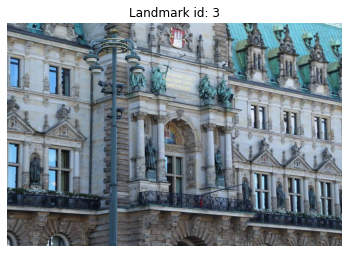

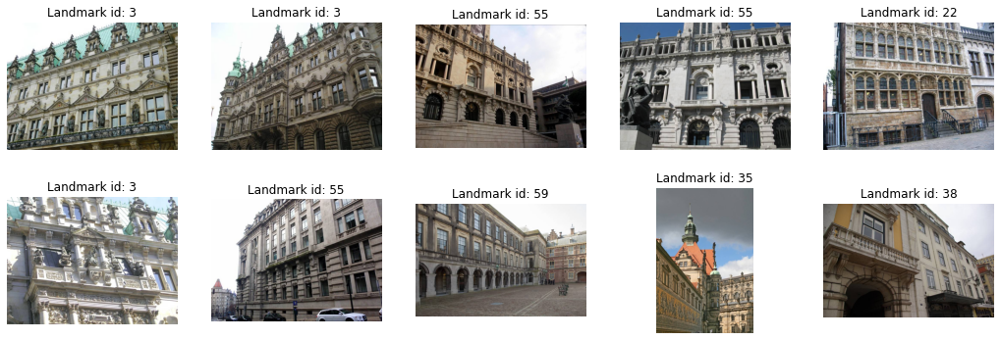

In [61]:
query_image_index = 1
top_n = 10

image_id = os.path.split(val_embeddings['images_paths'][query_image_index])[1]
query_landmark_id = os.path.split(os.path.split(val_embeddings['images_paths'][query_image_index])[0])[1]

similar_n = reranked_df['top_similar'][:top_n]

print(f"Queried image: {image_id}")
plt.figure(figsize = (6, 6))
plt.imshow(get_image(val_embeddings['images_paths'][query_image_index]))
plt.title(f"Landmark id: {query_landmark_id}")
plt.axis("off")
plot_similar(similar_n, train_embeddings['images_paths'])

Queried image: 8bd931f212ed57f2.jpg


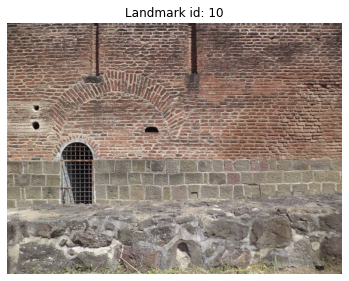

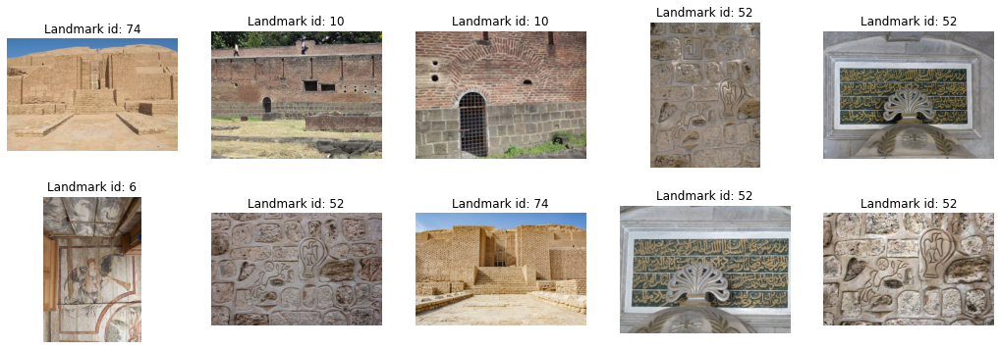

In [63]:
query_image_index = 2
top_n = 10

image_id = os.path.split(val_embeddings['images_paths'][query_image_index])[1]
query_landmark_id = os.path.split(os.path.split(val_embeddings['images_paths'][query_image_index])[0])[1]

similar_n = np.argsort(val_train_similarity[query_image_index])[::-1][:top_n]

print(f"Queried image: {image_id}")
plt.figure(figsize = (6, 6))
plt.imshow(get_image(val_embeddings['images_paths'][query_image_index]))
plt.title(f"Landmark id: {query_landmark_id}")
plt.axis("off")
plot_similar(similar_n, train_embeddings['images_paths'])

In [64]:
confidence_df = confidence_top(query = val_embeddings,
                               key = train_embeddings,
                               similarity = val_train_similarity,
                               query_image_index = query_image_index,
                               top = top_n)

confidence_df

,top_similar,image_paths,prediction,cos_similarity
0,160,/kaggle/working/train_sub/74/1fc5b489991c3e96.jpg,74,0.690753
1,2019,/kaggle/working/train_sub/10/af01e9aec2f8c641.jpg,10,0.644633
2,1095,/kaggle/working/train_sub/10/9560ce833ccc5eca.jpg,10,0.617240
3,8500,/kaggle/working/train_sub/52/3ff86807e481b44d.jpg,52,0.577733
4,7292,/kaggle/working/train_sub/52/2c87bae6c3380a14.jpg,52,0.565195
5,7671,/kaggle/working/train_sub/6/5b33611ef998f9e0.jpg,6,0.564067
6,7499,/kaggle/working/train_sub/52/230d143e6eb4ec30.jpg,52,0.562404
7,4340,/kaggle/working/train_sub/74/f44dc951556233f6.jpg,74,0.548284
8,5304,/kaggle/working/train_sub/52/a8576eb13e2d084f.jpg,52,0.545019
9,6357,/kaggle/working/train_sub/52/1f1227591bfabdc3.jpg,52,0.544400


In [70]:
reranked_df = delf_rerank(query = val_embeddings,
                          key = train_embeddings,
                          query_image_index = query_image_index,
                          confidence_df = confidence_df,
                          re_sort = True)
reranked_df

Retrieving local features for top 10 key images...


100%|██████████| 10/10 [00:09<00:00,  1.04it/s]


,top_similar,image_paths,prediction,cos_similarity,inliers,reranked_conf
2,1095,/kaggle/working/train_sub/10/9560ce833ccc5eca.jpg,10,0.617240,100,6.172403
1,2019,/kaggle/working/train_sub/10/af01e9aec2f8c641.jpg,10,0.644633,25,3.223164
0,160,/kaggle/working/train_sub/74/1fc5b489991c3e96.jpg,74,0.690753,9,2.072260
9,6357,/kaggle/working/train_sub/52/1f1227591bfabdc3.jpg,52,0.544400,7,1.440347
3,8500,/kaggle/working/train_sub/52/3ff86807e481b44d.jpg,52,0.577733,6,1.415152
6,7499,/kaggle/working/train_sub/52/230d143e6eb4ec30.jpg,52,0.562404,6,1.377603
7,4340,/kaggle/working/train_sub/74/f44dc951556233f6.jpg,74,0.548284,5,1.226001
5,7671,/kaggle/working/train_sub/6/5b33611ef998f9e0.jpg,6,0.564067,4,1.128134
4,7292,/kaggle/working/train_sub/52/2c87bae6c3380a14.jpg,52,0.565195,3,0.978947
8,5304,/kaggle/working/train_sub/52/a8576eb13e2d084f.jpg,52,0.545019,0,0.000000


Queried image: 8bd931f212ed57f2.jpg


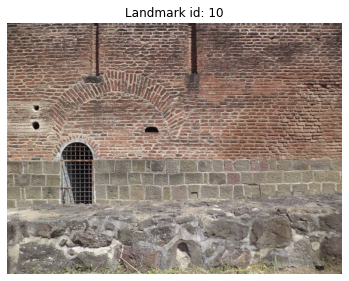

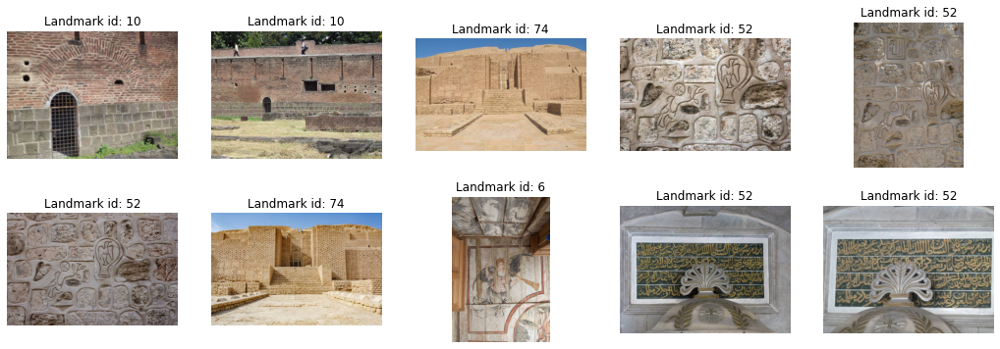

In [71]:
query_image_index = 2
top_n = 10

image_id = os.path.split(val_embeddings['images_paths'][query_image_index])[1]
query_landmark_id = os.path.split(os.path.split(val_embeddings['images_paths'][query_image_index])[0])[1]

similar_n = reranked_df['top_similar'][:top_n]

print(f"Queried image: {image_id}")
plt.figure(figsize = (6, 6))
plt.imshow(get_image(val_embeddings['images_paths'][query_image_index]))
plt.title(f"Landmark id: {query_landmark_id}")
plt.axis("off")
plot_similar(similar_n, train_embeddings['images_paths'])

Queried image: 2042d35320a8e127.jpg


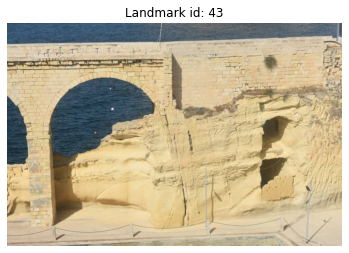

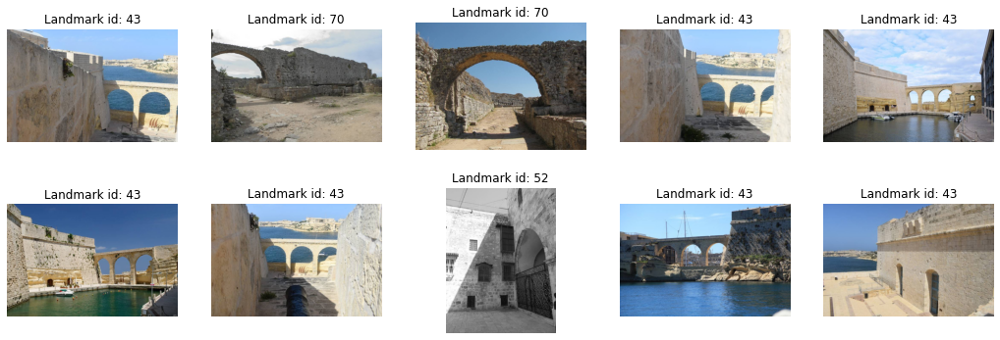

In [227]:
query_image_index = 101
top_n = 10

image_id = os.path.split(val_embeddings['images_paths'][query_image_index])[1]
query_landmark_id = os.path.split(os.path.split(val_embeddings['images_paths'][query_image_index])[0])[1]

similar_n = np.argsort(val_train_similarity[query_image_index])[::-1][:top_n]

print(f"Queried image: {image_id}")
plt.figure(figsize = (6, 6))
plt.imshow(get_image(val_embeddings['images_paths'][query_image_index]))
plt.title(f"Landmark id: {query_landmark_id}")
plt.axis("off")
plot_similar(similar_n, train_embeddings['images_paths'])

In [228]:
confidence_df = confidence_top(query = val_embeddings,
                               key = train_embeddings,
                               similarity = val_train_similarity,
                               query_image_index = query_image_index,
                               top = top_n)

confidence_df

,top_similar,image_paths,prediction,cos_similarity
0,6163,/kaggle/working/train_sub/43/aab1d3e70d649d2c.jpg,43,0.766288
1,5213,/kaggle/working/train_sub/70/14857abf5d812470.jpg,70,0.718219
2,2119,/kaggle/working/train_sub/70/14a3f6d749a93487.jpg,70,0.703141
3,5148,/kaggle/working/train_sub/43/639ac55944bcf787.jpg,43,0.702235
4,8439,/kaggle/working/train_sub/43/0dcf580533f1d856.jpg,43,0.682921
5,414,/kaggle/working/train_sub/43/1c8008684140469d.jpg,43,0.676381
6,6622,/kaggle/working/train_sub/43/303a3a94dadc52f4.jpg,43,0.674131
7,9652,/kaggle/working/train_sub/52/adc61785cdf95c46.jpg,52,0.655948
8,2274,/kaggle/working/train_sub/43/96fdb3e8bb0fbf35.jpg,43,0.628031
9,8704,/kaggle/working/train_sub/43/309d4d01bd57be5d.jpg,43,0.627753


In [229]:
reranked_df = delf_rerank(query = val_embeddings,
                          key = train_embeddings,
                          query_image_index = query_image_index,
                          confidence_df = confidence_df,
                          re_sort = True)
reranked_df

Retrieving local features for top 10 key images...


100%|██████████| 10/10 [00:10<00:00,  1.01s/it]


,top_similar,image_paths,prediction,cos_similarity,inliers,reranked_conf
0,6163,/kaggle/working/train_sub/43/aab1d3e70d649d2c.jpg,43,0.766288,37,4.661151
6,6622,/kaggle/working/train_sub/43/303a3a94dadc52f4.jpg,43,0.674131,39,4.209949
3,5148,/kaggle/working/train_sub/43/639ac55944bcf787.jpg,43,0.702235,35,4.154477
5,414,/kaggle/working/train_sub/43/1c8008684140469d.jpg,43,0.676381,30,3.704694
4,8439,/kaggle/working/train_sub/43/0dcf580533f1d856.jpg,43,0.682921,28,3.613677
8,2274,/kaggle/working/train_sub/43/96fdb3e8bb0fbf35.jpg,43,0.628031,16,2.512125
2,2119,/kaggle/working/train_sub/70/14a3f6d749a93487.jpg,70,0.703141,12,2.435753
9,8704,/kaggle/working/train_sub/43/309d4d01bd57be5d.jpg,43,0.627753,12,2.174599
1,5213,/kaggle/working/train_sub/70/14857abf5d812470.jpg,70,0.718219,9,2.154656
7,9652,/kaggle/working/train_sub/52/adc61785cdf95c46.jpg,52,0.655948,9,1.967843


Queried image: 2042d35320a8e127.jpg


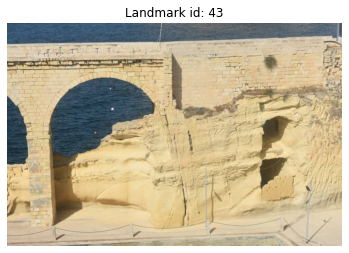

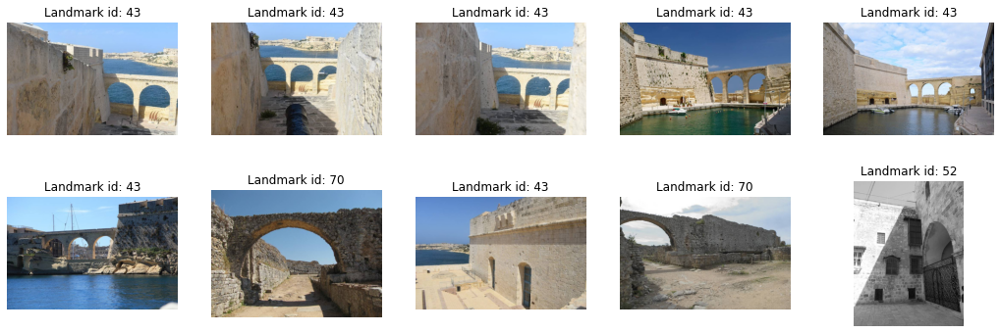

In [230]:
query_image_index = 101
top_n = 10

image_id = os.path.split(val_embeddings['images_paths'][query_image_index])[1]
query_landmark_id = os.path.split(os.path.split(val_embeddings['images_paths'][query_image_index])[0])[1]

similar_n = reranked_df['top_similar'][:top_n]

print(f"Queried image: {image_id}")
plt.figure(figsize = (6, 6))
plt.imshow(get_image(val_embeddings['images_paths'][query_image_index]))
plt.title(f"Landmark id: {query_landmark_id}")
plt.axis("off")
plot_similar(similar_n, train_embeddings['images_paths'])

## Under-represented query image
Effect of querying images not well represented on the key set

Queried image: 87efcb323df2f906.jpg


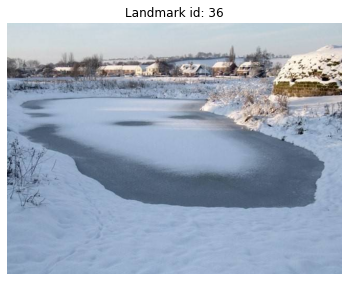

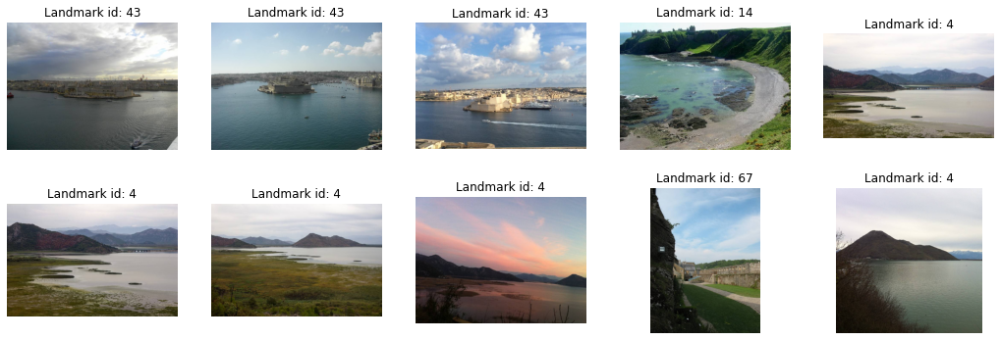

In [91]:
query_image_index = 8
top_n = 10

image_id = os.path.split(val_embeddings['images_paths'][query_image_index])[1]
query_landmark_id = os.path.split(os.path.split(val_embeddings['images_paths'][query_image_index])[0])[1]

similar_n = np.argsort(val_train_similarity[query_image_index])[::-1][:top_n]

print(f"Queried image: {image_id}")
plt.figure(figsize = (6, 6))
plt.imshow(get_image(val_embeddings['images_paths'][query_image_index]))
plt.title(f"Landmark id: {query_landmark_id}")
plt.axis("off")
plot_similar(similar_n, train_embeddings['images_paths'])

Let's investigate what the model has seen for landmark 36 during training...

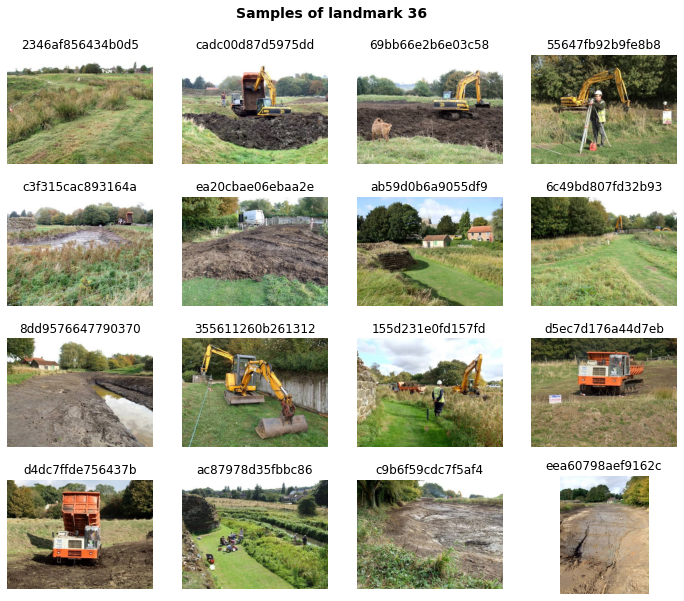

In [172]:
get_landmark(36)

Query image has a representative issue when considering how the landmark appears on key set and how it was seen during training